In [2]:
# Imports
import numpy as np
import pandas as pd
from pathlib import Path
import ast
import math
from PIL import Image
from shapely.geometry import Polygon, Point
from matplotlib import pyplot as plt
import glob
import os.path
import PIL.ImageDraw
from sklearn.model_selection import GroupShuffleSplit
import xml.etree.cElementTree as ET

# 1. Data Analysis
---
For this project the following Kaggle dataset is used: https://www.kaggle.com/datasets/airbusgeo/airbus-aircrafts-sample-dataset
With this dataset it is possible to perform a custom object detection on airplanes.

This Dataset contains a set of 103 images of the size 2560px * 2560px


## 1.1 Images
---

103
(2560, 2560)


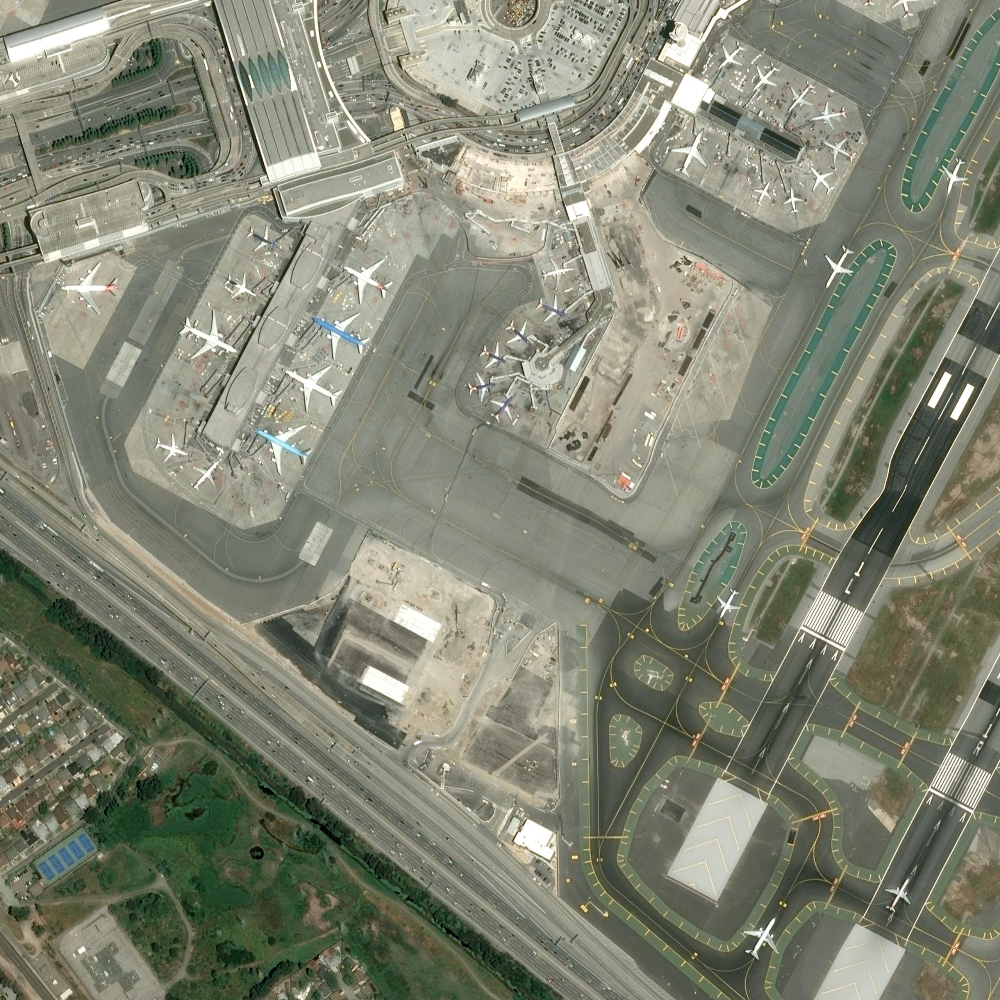

In [7]:
# import all images
img_list = list(Path('../../data_raw').glob('images/*.jpg'))
img = PIL.Image.open(img_list[0])
print(len(img_list))
print(img.size)
display(img)

## 1.2  Annotations
---
In the annotations.csv file are the bounding boxes for the airplanes stored. Further more the class of the object is stored in the class column.

In [6]:
# convert a string record into a valid python object
def f(x): 
    return ast.literal_eval(x.rstrip('\r\n'))

df_annotations = pd.read_csv(Path('../../data_raw/annotations.csv'), 
                converters={'geometry': f})
df_annotations.head(5)

,id,image_id,geometry,class
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane


In [10]:
# The available object classes
df_annotations['class'].value_counts()

Airplane              3316
Truncated_airplane     109
Name: class, dtype: int64

In [ ]:
# The available object classes
df_annotations['class'].value_counts()

In [ ]:
df_annotations['image_id'].value_counts().sort_index()

## 1.3 Visulize the Bounding Boxes
---

In [ ]:
import os.path
import PIL.ImageDraw

img = PIL.Image.open(img_list[0])
draw = PIL.ImageDraw.Draw(img)

for k, row in df_annotations[df_annotations['image_id'] == os.path.basename(img_list[0])].iterrows():
    draw.polygon(row['geometry'], outline=(255,0,0))
    draw.text(row['geometry'][0], row['class'], fill=(255,0,0))
    
display(img)

## 1.3 Create Bounding Boxes
---
The geometry of the bounding boxes is stored in the annotations.csv file.
To use the bounding boxes for visualizations and for the tensorflow training we use a different format.

In [12]:
def getBounds(geometry):
    try: 
        arr = np.array(geometry).T
        xmin = np.min(arr[0])
        ymin = np.min(arr[1])
        xmax = np.max(arr[0])
        ymax = np.max(arr[1])
        return (xmin, ymin, xmax, ymax)
    except:
        return np.nan

def getWidth(bounds):
    try: 
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(xmax - xmin)
    except:
        return np.nan

def getHeight(bounds):
    try: 
        (xmin, ymin, xmax, ymax) = bounds
        return np.abs(ymax - ymin)
    except:
        return np.nan

# Create bounds, width and height
df_annotations.loc[:,'bounds'] = df_annotations.loc[:,'geometry'].apply(getBounds)
df_annotations.loc[:,'width'] = df_annotations.loc[:,'bounds'].apply(getWidth)
df_annotations.loc[:,'height'] = df_annotations.loc[:,'bounds'].apply(getHeight)

# Display head
df_annotations.head(5)

,id,image_id,geometry,class,bounds,width,height
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(135, 522), (245, 522), (245, 600), (135, 600...",Airplane,"(135, 522, 245, 600)",110,78
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1025, 284), (1125, 284), (1125, 384), (1025,...",Airplane,"(1025, 284, 1125, 384)",100,100
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(1058, 1503), (1130, 1503), (1130, 1568), (10...",Airplane,"(1058, 1503, 1130, 1568)",72,65
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(813, 1518), (885, 1518), (885, 1604), (813, ...",Airplane,"(813, 1518, 885, 1604)",72,86
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[(594, 938), (657, 938), (657, 1012), (594, 10...",Airplane,"(594, 938, 657, 1012)",63,74


# 1. Data Preparation
---
This Notebook is used to prepare the Airplane Pictures for the Tensorflow Object Detection API \
Installation-Guide: https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html